In [1]:
import IPython.html.widgets
import netCDF4
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
from matplotlib.mlab import griddata
from matplotlib.pylab import meshgrid

%matplotlib inline

:0: FutureWarning: IPython widgets are experimental and may change in the future.


/opt/local/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/matplotlib/tri/triangulation.py:110: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  self._neighbors)
/opt/local/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/matplotlib/pyplot.py:423: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


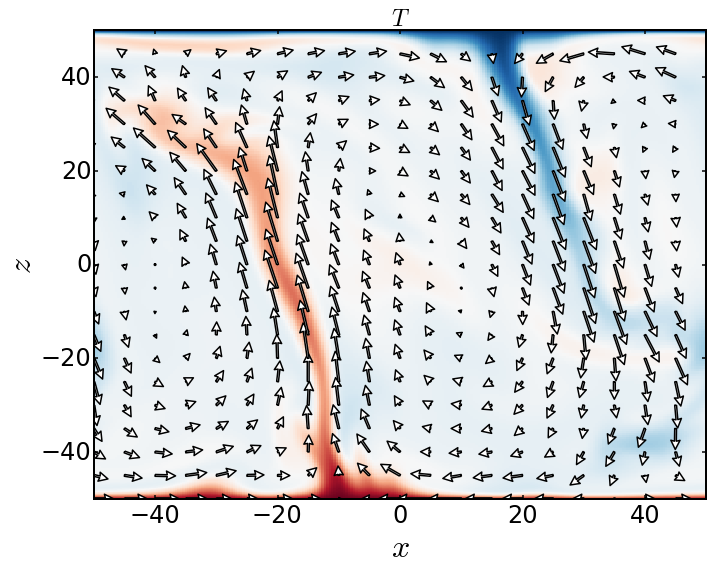

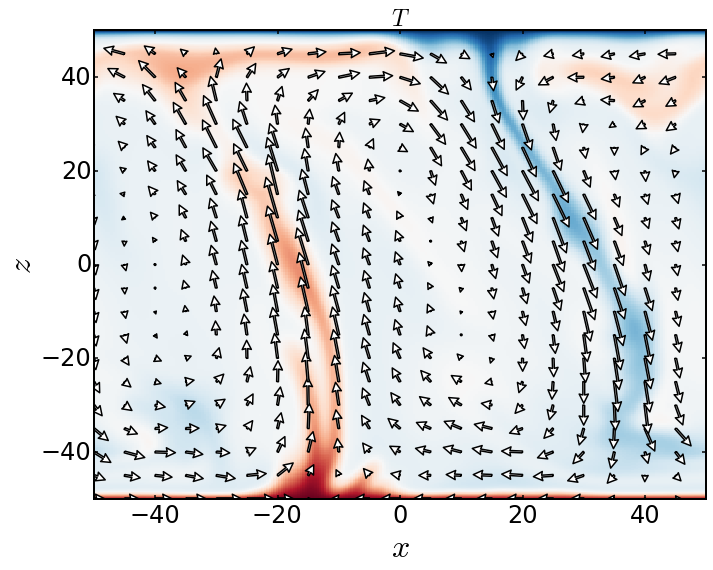

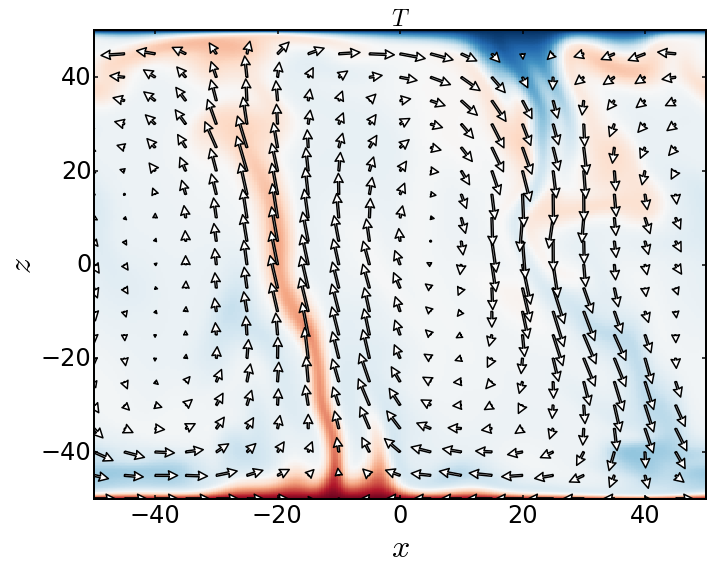

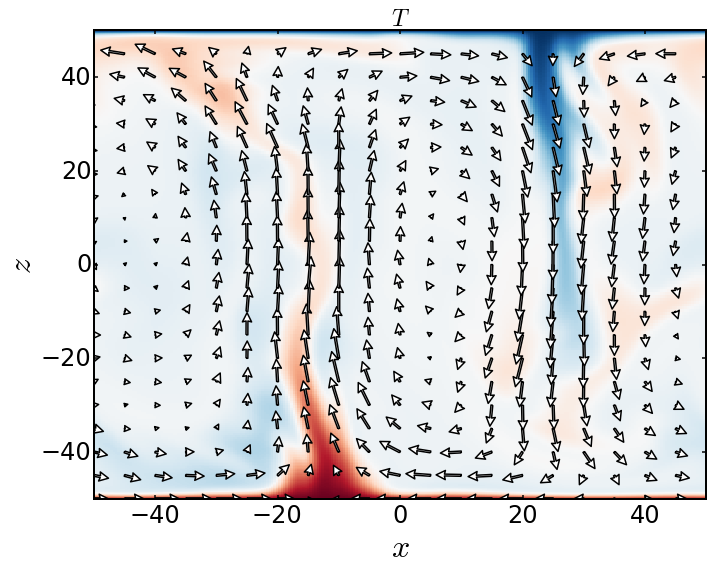

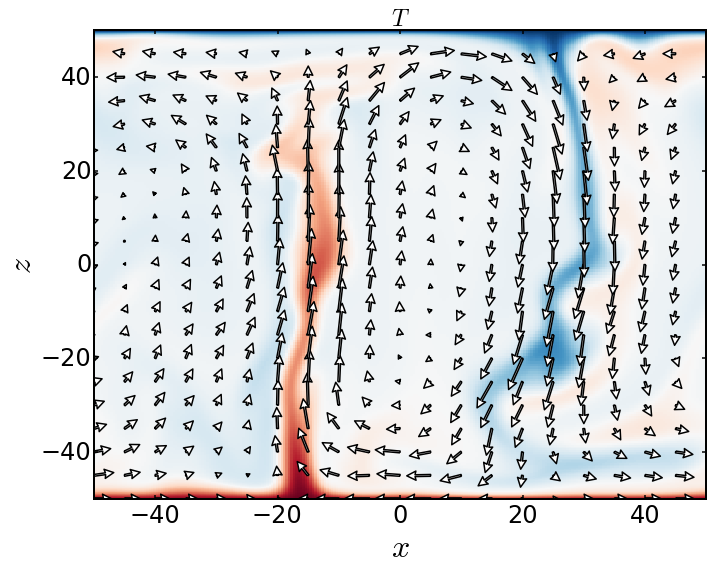

...

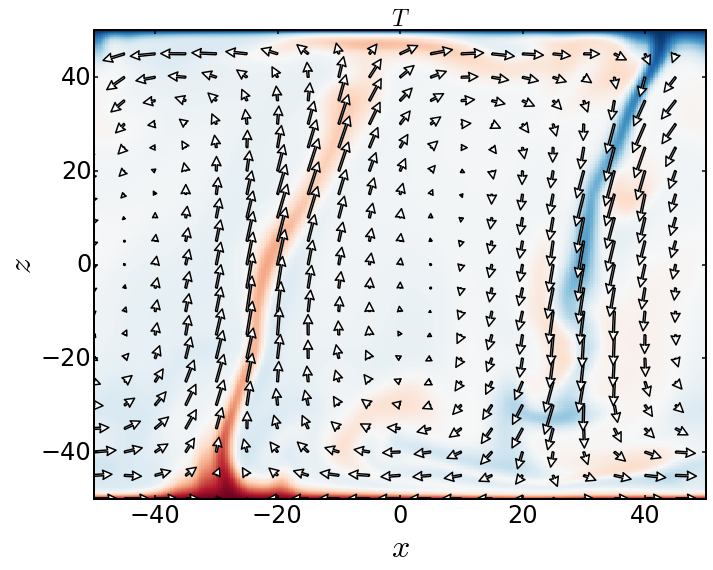

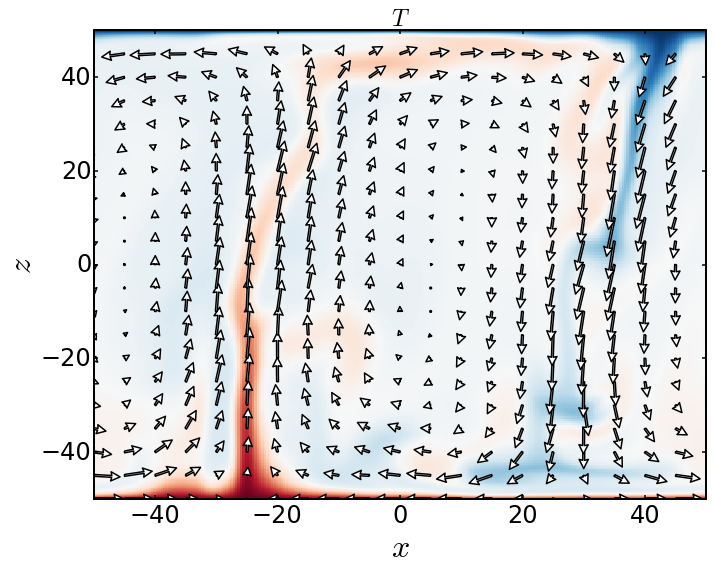

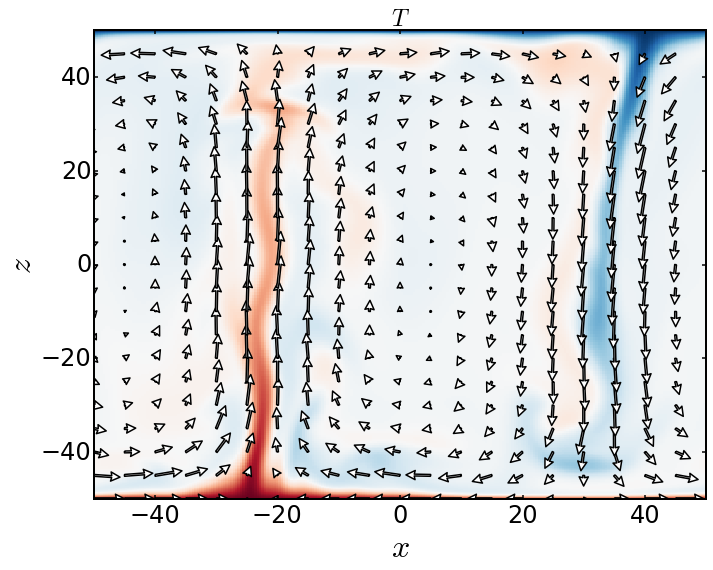

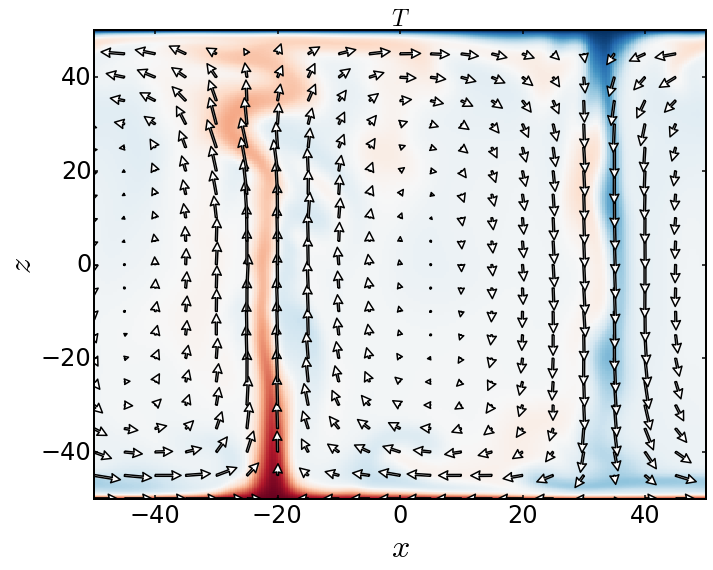

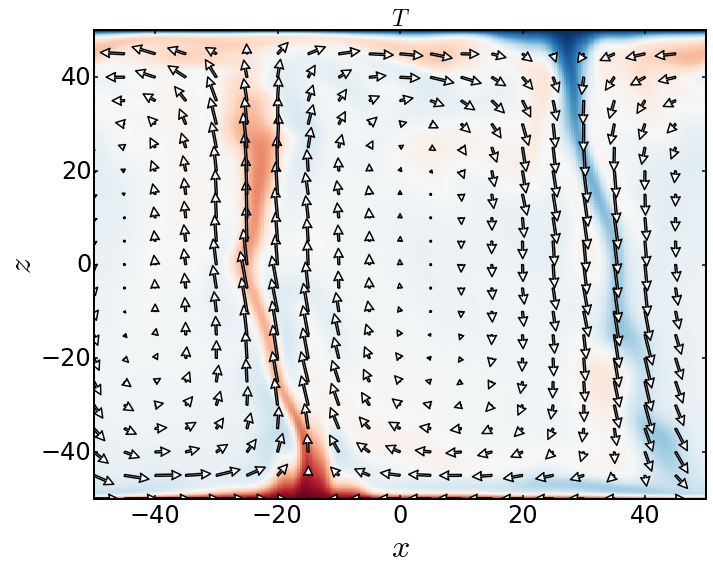

In [3]:
plt.style.use ("presentation")

datasets = []
datasets.append ([])
datasets [0].append (netCDF4.Dataset ('../sims/example/output/sc_gwave_00.cdf', 'r'))
datasets [0].append (netCDF4.Dataset ('../sims/example/output/sc_gwave_1_00.cdf', 'r'))

# # datasets.append (netCDF4.Dataset ('../sims/variable/output/output_01.cdf', 'r'))

# # ts = {}
# per = 4

xdata = []
zdata = []
tdata = []
cdata = []
divdata = []
udata = []
wdata = []

for dataset in datasets:
    xdata.append (np.concatenate ([record.variables ["x"] for record in dataset]))
    zdata.append (np.concatenate ([record.variables ["z"] for record in dataset]))
    tdata.append (np.concatenate ([record.variables ["temperature"] for record in dataset]))
    cdata.append (np.concatenate ([record.variables ["composition"] for record in dataset]))
    udata.append (np.concatenate ([record.variables ["x_velocity"] for record in dataset]))
    wdata.append (np.concatenate ([record.variables ["z_velocity"] for record in dataset]))
    
for i in range (162, len (xdata [0])):
    record = i

    x = sum ([ma.getdata (data [record]) for data in xdata])
    y = sum ([ma.getdata (data [record]) for data in zdata])
    t = sum ([ma.getdata (data [record]) for data in tdata])
    c = sum ([ma.getdata (data [record]) for data in cdata])
#     d = sum ([ma.getdata (data [record]) for data in divdata])
    u = sum ([ma.getdata (data [record]) for data in udata])
    w = sum ([ma.getdata (data [record]) for data in wdata])
    
    X, Y = meshgrid (np.arange (np.min (x), np.max (x), 5), np.arange (np.min (y), np.max (y), 5))
    
    U = griddata (x.flatten (), y.flatten (), u.flatten (), X, Y, interp = "linear")
    W = griddata (x.flatten (), y.flatten (), w.flatten (), X, Y, interp = "linear")

    fig = plt.figure(figsize = (10, 8))
    ax = plt.subplot (111)
    p = ax.pcolormesh (x.T, y.T, t.T - y.T, cmap = plt.get_cmap ("RdBu_r"), vmin = -50, vmax = 50)
    if np.max (u) > 0.0:
        v = ax.quiver (X, Y, U, W, color = "white", linewidth = 1.5, headwidth = 5, headlength = 5)

#     cb = plt.colorbar (p)

    ax.set_xlim ((x [0,0], x [-1,-1]))
    ax.set_ylim ((y [0,0], y [-1,-1]))
    
    ax.set_xlabel ("$x$")
    ax.set_ylabel ("$z$")
    ax.set_title ("$T$")
        
#     ax = plt.subplot (111)
#     p = ax.pcolormesh (x.T, y.T, c.T - y.T * 1.15, cmap = plt.get_cmap ("gray_r"), vmin = -50, vmax = 50)
#     if np.max (u) > 0.0:
#         v = ax.quiver (X, Y, U, W, color = "white", linewidth = 1.5, headwidth = 5, headlength = 5)
        
# #     cb = plt.colorbar (p)

#     ax.set_xlim ((x [0,0], x [-1,-1]))
#     ax.set_ylim ((y [0,0], y [-1,-1]))

#     ax.set_xlabel ("$x$")
#     ax.set_ylabel ("$z$")
#     ax.set_title ("$\Delta \mu$")
    
    # x = np.linspace(0, 10, 1000)

#     lines = [ax.axhline (i, -200, 200, lw = 1.0) for i in y [0,::4].flat]
#     vlines = [ax.axvline (i, -200, 200, lw = 1.0) for i in x [::4,0].flat]
    plt.tight_layout ()

    plt.savefig ("layer_%03i.png" % i)

In [15]:
y.flatten ()

array([-50.        , -49.98517349, -49.94070276, ...,  49.94070276,
        49.98517349,  50.        ])

In [9]:
len (xdata [0])

200

In [ ]:
len (c